<a href="https://colab.research.google.com/github/kospi-2025/EVT/blob/main/EVT21_MRL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
!pip install -q lmoments3
!pip install -q pyextremes

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

import lmoments3 as lm

from scipy.stats import genpareto
from lmoments3 import distr
from pyextremes import plot_mean_residual_life
from pyextremes import plot_parameter_stability
from pyextremes import get_extremes

In [15]:
import pandas as pd
import numpy as np

# 1. GitHub에서 ticker_info.csv 불러오기
ticker_info_url = "https://raw.githubusercontent.com/kospi-2025/EVT/main/source_data/ticker_info.csv"
df = pd.read_csv(ticker_info_url)
df['id'] = df['id'].astype(str).str.zfill(6)
df['Yahoo_Ticker'] = df['id'] + ".KS"

# 2. ^KS200 수동 추가
df_index = pd.DataFrame({
    "Yahoo_Ticker": ["^KS200"],
    "name": ["KOSPI 200 Index"],
    "sector": ["Index"]
})

df_info = pd.concat([df, df_index], ignore_index=True)

# 3. 매핑 딕셔너리 생성
ticker_to_name = dict(zip(df_info["Yahoo_Ticker"], df_info["name"]))
ticker_to_sector = dict(zip(df_info["Yahoo_Ticker"], df_info["sector"]))

# 4. 섹터 목록 만들기 (고유값)
sectors = df_info["sector"].dropna().unique()

# 5. 섹터별 파일 불러오기
base_url = "https://raw.githubusercontent.com/kospi-2025/EVT/main/source_data/"
sector_data = {}

for sec in sectors:
    file_name = sec + ".csv"
    url = f"{base_url}{file_name}"
    try:
        df_sector = pd.read_csv(url, header=[0, 1], index_col=0, parse_dates=True)
        sector_data[sec] = df_sector
        print(f"✅ Loaded {sec}")
    except Exception as e:
        print(f"❌ Failed to load {sec}: {e}")

#==================================

temp = pd.concat(sector_data.values(), axis=1).sort_index(axis=1)

tickers_to_drop = ["000660.KS", "032640.KS"]

data = temp.loc[:, ~temp.columns.get_level_values(1).isin(tickers_to_drop)]
logDD = -np.log(data["Low"]/data["Close"].shift(1)).where(lambda x: x < 0)

✅ Loaded Communication_Services
✅ Loaded Constructions
✅ Loaded Consumer_Discretionary
✅ Loaded Consumer_Staples
✅ Loaded Energy_Chemicals
✅ Loaded Financials
✅ Loaded Health_Care
✅ Loaded Heavy_Industries
✅ Loaded Industrials
✅ Loaded IT
✅ Loaded Steels_Materials
✅ Loaded Index


In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lmoments3 as lm

# 예: logDD = pd.Series([...])
def theoretical_tau4_from_tau3(tau3):
    return (tau3 * (5 * tau3 + 1)) / (tau3 + 5)

def compute_l_moments_ratio(excesses):
    try:
        lmr = lm.lmom_ratios(excesses, nmom=4)
        l1, l2 = lmr[0], lmr[1]
        tau3, tau4 = lmr[2], lmr[3]
        return tau3, tau4
    except:
        return np.nan, np.nan

def find_best_thresholds(series, quantiles=np.linspace(0.01, 0.99, 99), top_n=5):
    series = series.dropna().sort_index()
    results = []

    for q in quantiles:
        u = series.quantile(q)
        excess = series[series > u] - u
        if len(excess) < 10:
            continue

        tau3_emp, tau4_emp = compute_l_moments_ratio(excess)
        if np.isnan(tau3_emp) or np.isnan(tau4_emp):
            continue

        tau4_theory = theoretical_tau4_from_tau3(tau3_emp)
        error = ((tau4_emp / tau4_theory) - 1) ** 2

        results.append({
            "quantile": q,
            "threshold": u,
            "tau3_emp": tau3_emp,
            "tau4_emp": tau4_emp,
            "tau4_theory": tau4_theory,
            "error": error
        })

    df = pd.DataFrame(results)
    df_sorted = df.sort_values("error").reset_index(drop=True)
    return df_sorted.head(top_n)


In [17]:
logDD

,000080.KS,000100.KS,000120.KS,000150.KS,000210.KS,000240.KS,000270.KS,000720.KS,000810.KS,000880.KS,...,375500.KS,377300.KS,383220.KS,402340.KS,450080.KS,454910.KS,456040.KS,457190.KS,489790.KS,^KS200
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,7.470432e-02,0.049791,0.088853,9.845054e-08,9.289365e-02,0.057894,0.055959,6.773822e-02,0.050644,0.102279,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,0.070866,0.069843,6.108786e-02,8.149329e-02,0.056967,0.044125,8.233029e-02,0.095310,0.108683,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032828
2000-01-07,7.410793e-02,0.034869,0.012685,NaN,2.790855e-02,NaN,0.022815,NaN,NaN,0.013008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.034873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-23,4.807721e-03,NaN,0.006200,2.215600e-02,7.190784e-08,0.009091,0.016941,2.037069e-08,NaN,NaN,...,NaN,0.013195,0.020352,NaN,0.039051,0.014903,0.004930,NaN,NaN,NaN
2024-12-24,1.962302e-08,0.041493,0.008521,9.990068e-03,4.447746e-03,0.029520,0.013972,5.763723e-03,0.010811,0.008905,...,0.010630,0.013048,0.035221,0.015941,0.017143,0.005923,0.011263,NaN,0.015346,0.003474
2024-12-26,1.684755e-02,0.019015,0.014706,3.278982e-02,8.915316e-03,0.019814,0.009990,1.160552e-02,0.010870,0.010733,...,0.027694,0.034289,0.030248,0.011146,0.048575,NaN,0.012987,0.025560,0.003295,0.006110


In [18]:
all_results = []

for ticker in logDD.columns:
    series = logDD[ticker]
    print(f"Processing {ticker}...")

    try:
        df_ticker = find_best_thresholds(series, quantiles=np.linspace(0.01, 0.99, 99), top_n=5)
        df_ticker = df_ticker.copy()  # 슬라이스 경고 방지용 복사본

        df_ticker.loc[:, "Ticker"] = ticker
        df_ticker.loc[:, "Name"] = ticker_to_name.get(ticker, "")
        df_ticker.loc[:, "Sector"] = ticker_to_sector.get(ticker, "KOSPI200")

        all_results.append(df_ticker)
    except Exception as e:
        print(f"Error processing {ticker}: {e}")

# 하나로 합치기
df_all = pd.concat(all_results, ignore_index=True)

# 저장
df_all.to_csv("best_thresholds_lmoment.csv", index=False)


Processing 000080.KS...
Processing 000100.KS...
Processing 000120.KS...
Processing 000150.KS...
Processing 000210.KS...
Processing 000240.KS...
Processing 000270.KS...
Processing 000720.KS...
Processing 000810.KS...
Processing 000880.KS...
Processing 001040.KS...
Processing 001120.KS...
Processing 001430.KS...
Processing 001440.KS...
Processing 001450.KS...
Processing 001680.KS...
Processing 001740.KS...
Processing 001800.KS...
Processing 002380.KS...
Processing 002710.KS...
Processing 002790.KS...
Processing 002840.KS...
Processing 003030.KS...
Processing 003090.KS...
Processing 003230.KS...
Processing 003240.KS...
Processing 003490.KS...
Processing 003550.KS...
Processing 003620.KS...
Processing 003670.KS...
Processing 004000.KS...
Processing 004020.KS...
Processing 004170.KS...
Processing 004370.KS...
Processing 004490.KS...
Processing 004990.KS...
Processing 005070.KS...
Processing 005250.KS...
Processing 005300.KS...
Processing 005380.KS...
Processing 005420.KS...
Processing 00549

# MRL

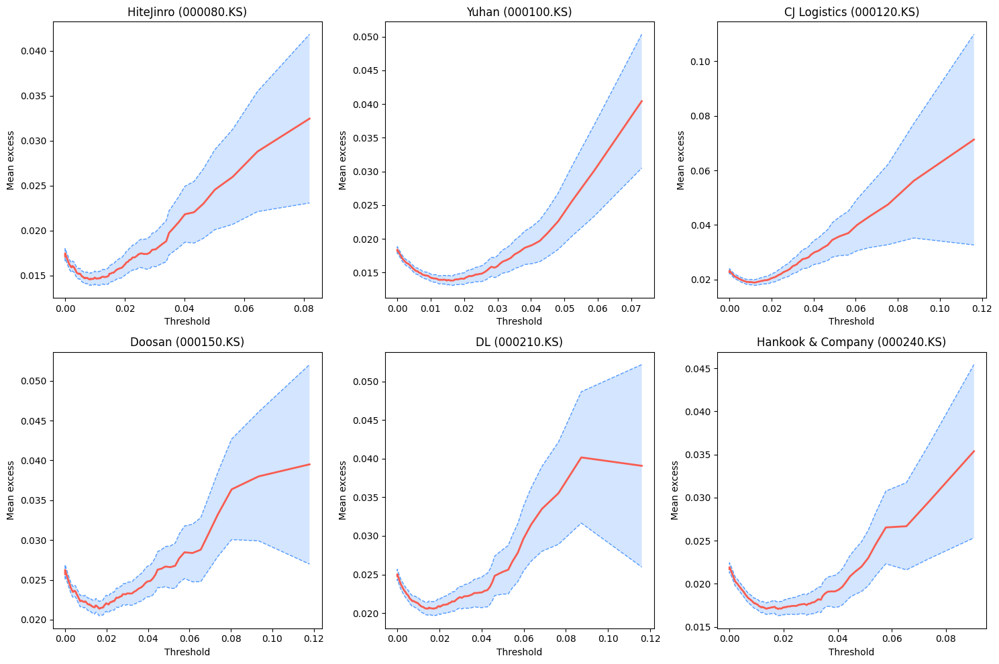

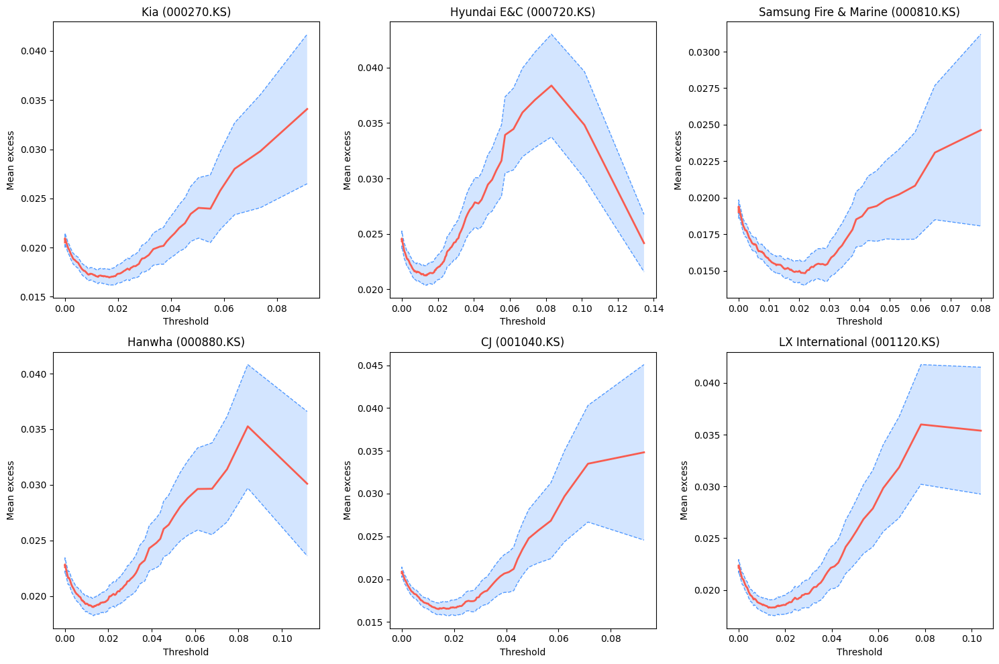

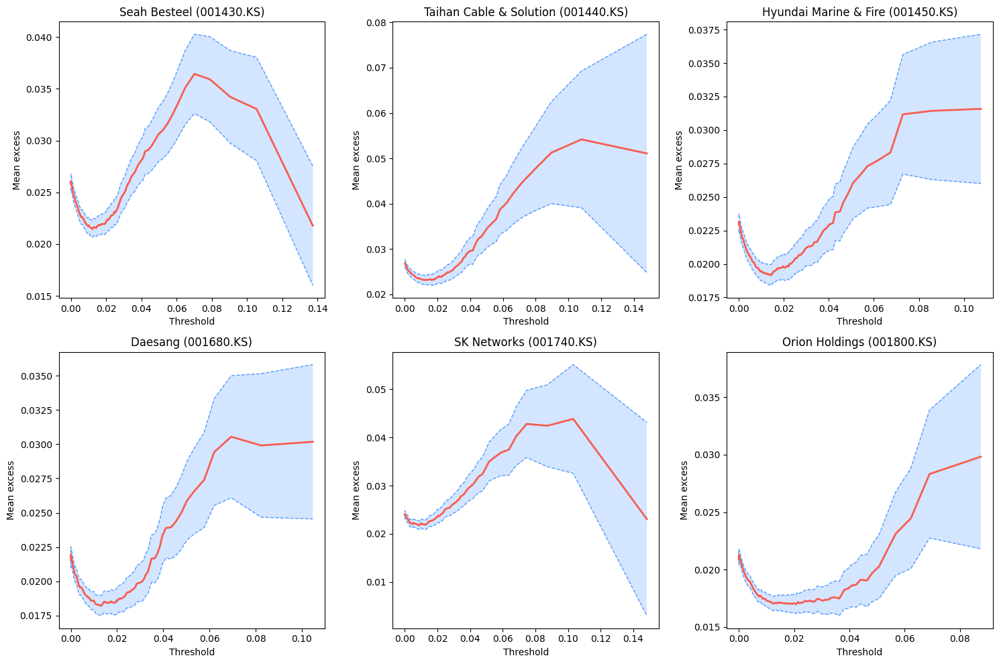

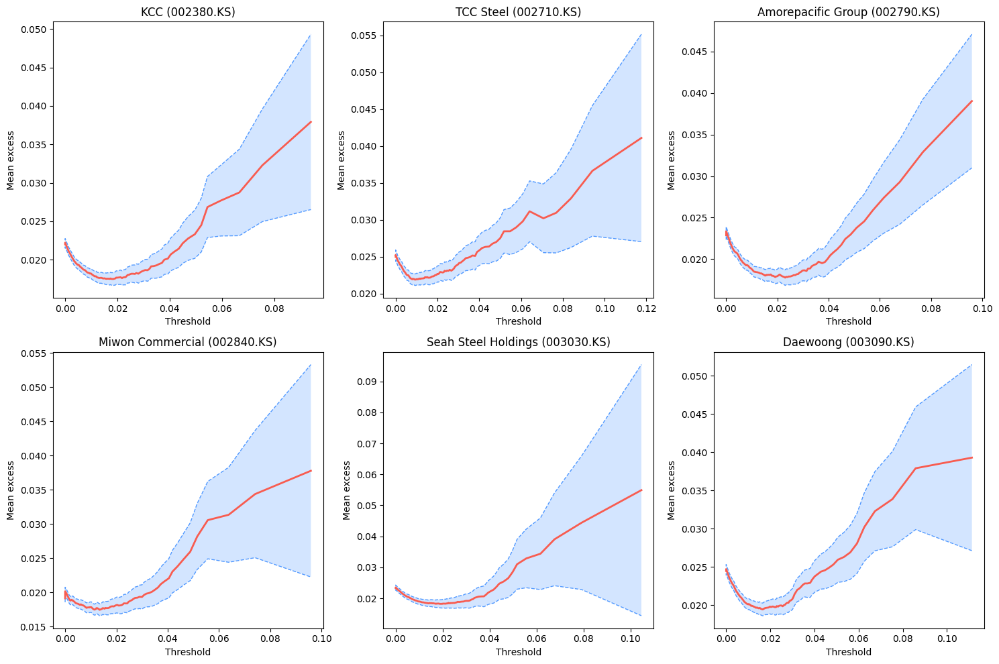

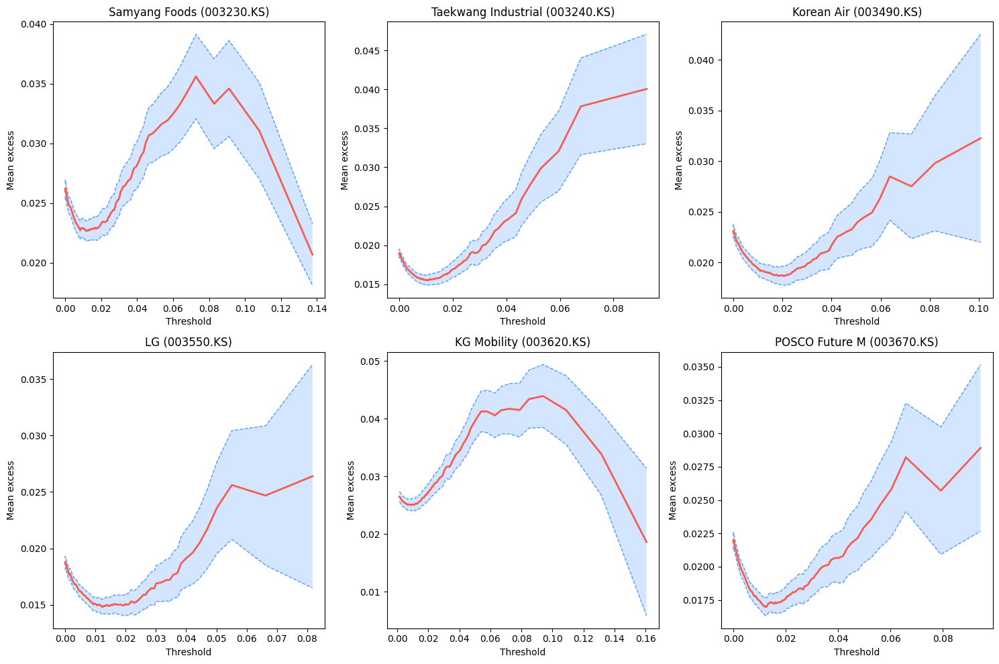

...

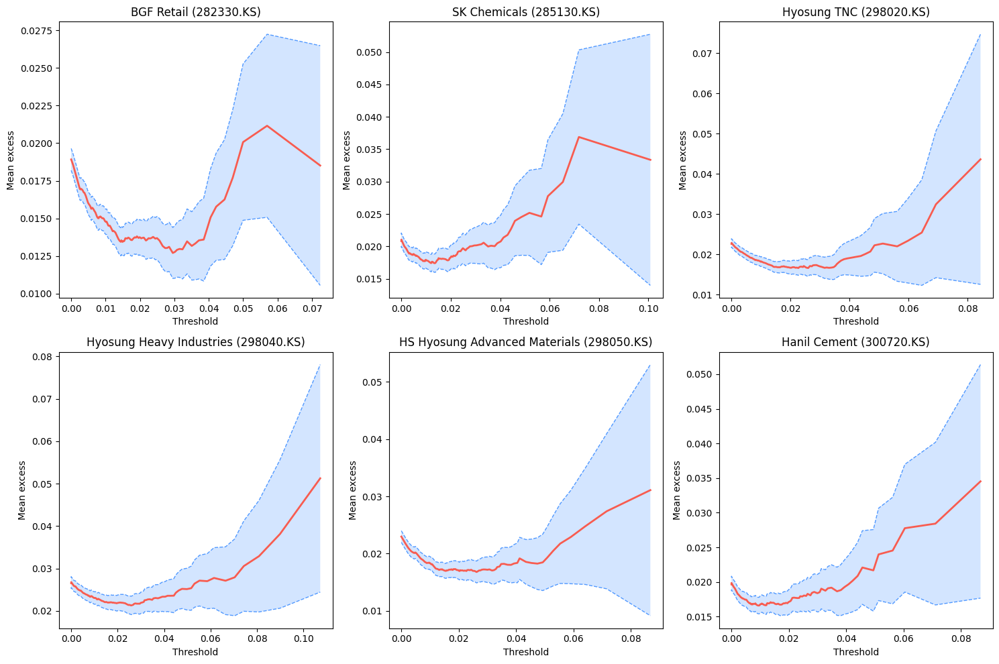

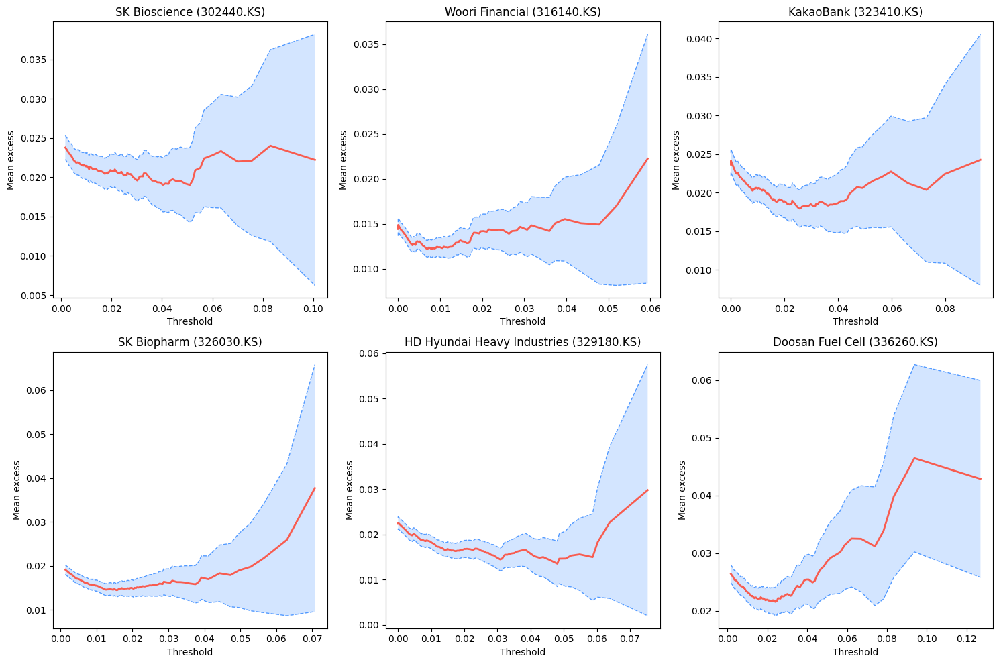

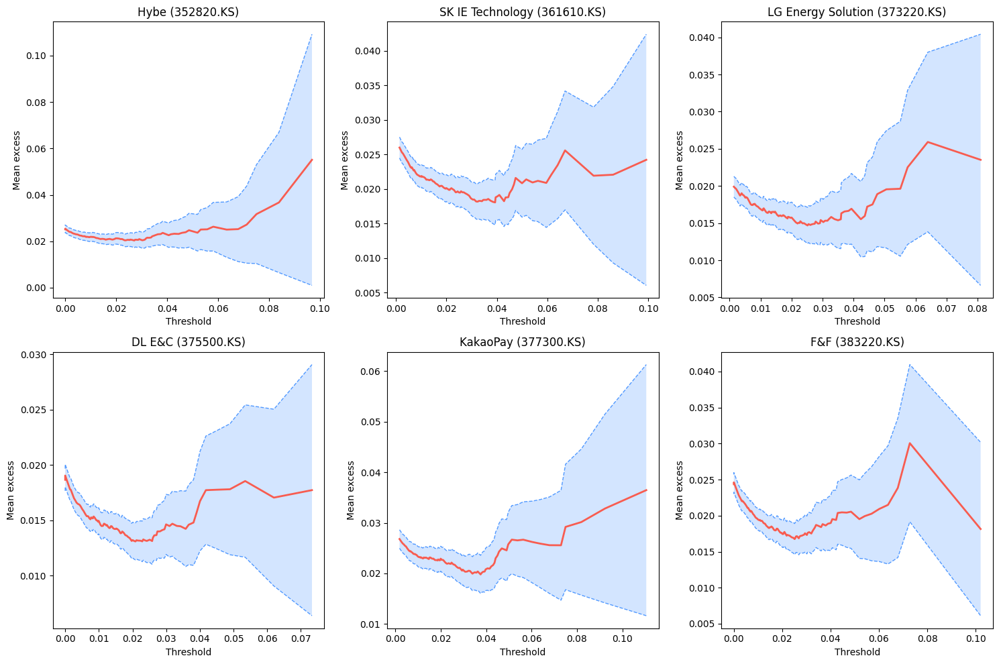

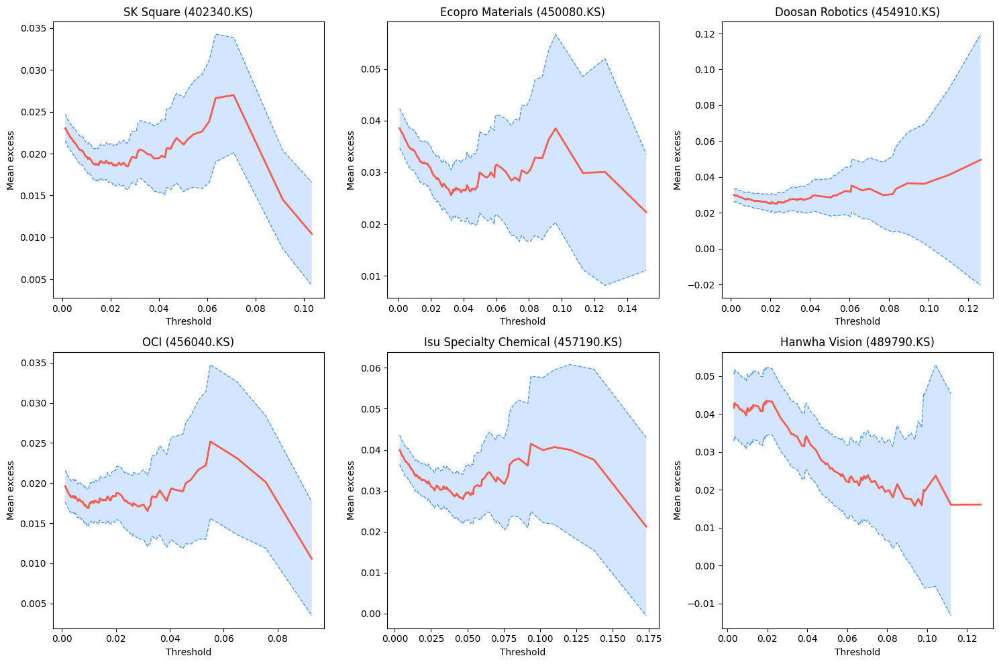

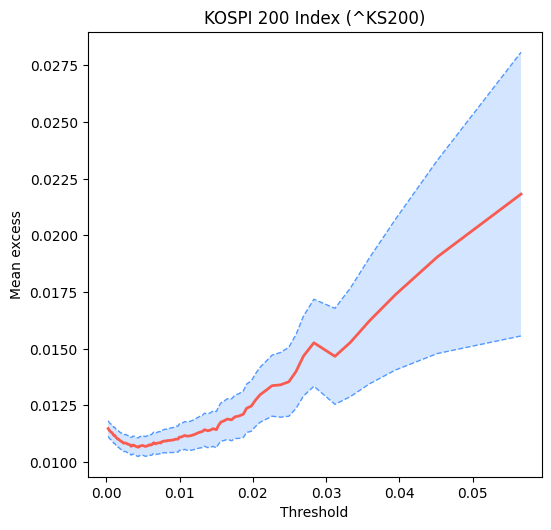

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from pyextremes import plot_mean_residual_life

# PDF 저장 객체 생성
with PdfPages("mrl_plots.pdf") as pdf:
    tickers = df_all["Ticker"].unique()

    # 6개씩 페이지 분할
    for i in range(0, len(tickers), 6):
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2행 3열
        axes = axes.flatten()

        for j, ticker in enumerate(tickers[i:i+6]):
            ax = axes[j]
            series = logDD[ticker].dropna().sort_index()
            q = np.linspace(0.01, 0.99, 99)
            us = series.quantile(q)

            # MRL plot 그리기
            plot_mean_residual_life(
                series,
                thresholds=us,
                alpha=0.95,
                extremes_type="high",
                ax=ax
            )
            # for u in thresholds:
            #     ax.axvline(u, color="red", linestyle="--", alpha=0.7)

            ax.set_title(f"{ticker_to_name[ticker]} ({ticker})")

        # 남은 subplot 비우기
        for k in range(j + 1, 6):
            fig.delaxes(axes[k])

        plt.tight_layout()
        plt.show()
        pdf.savefig(fig)
        plt.close(fig)

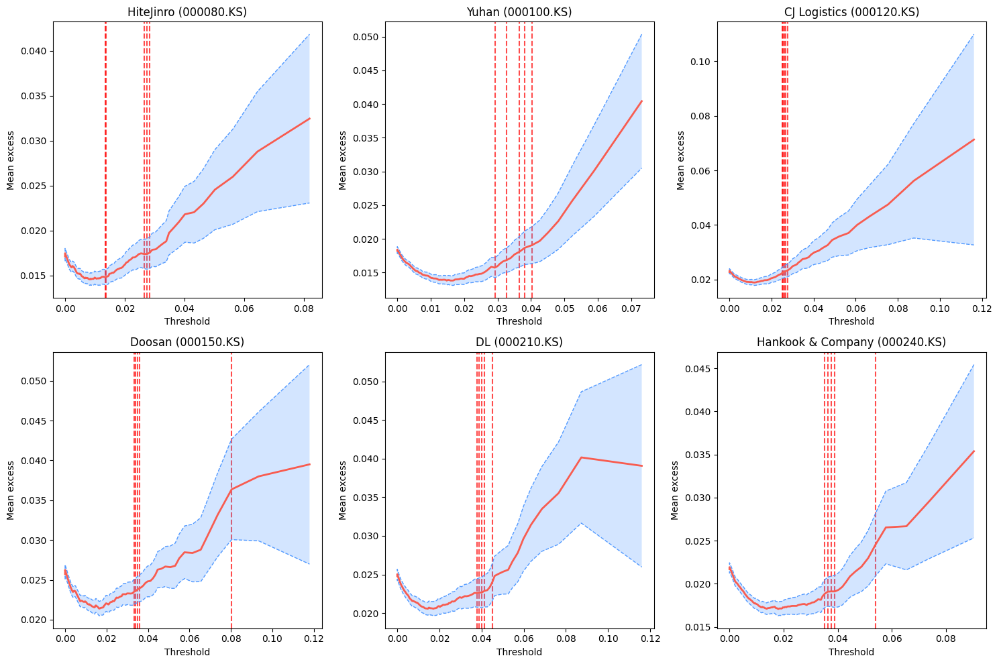

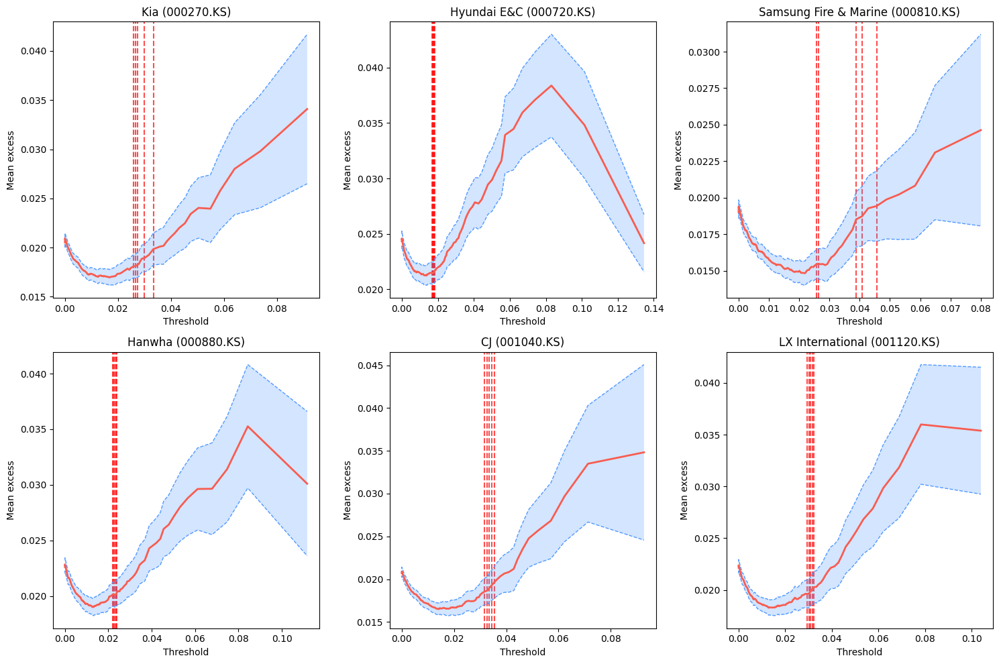

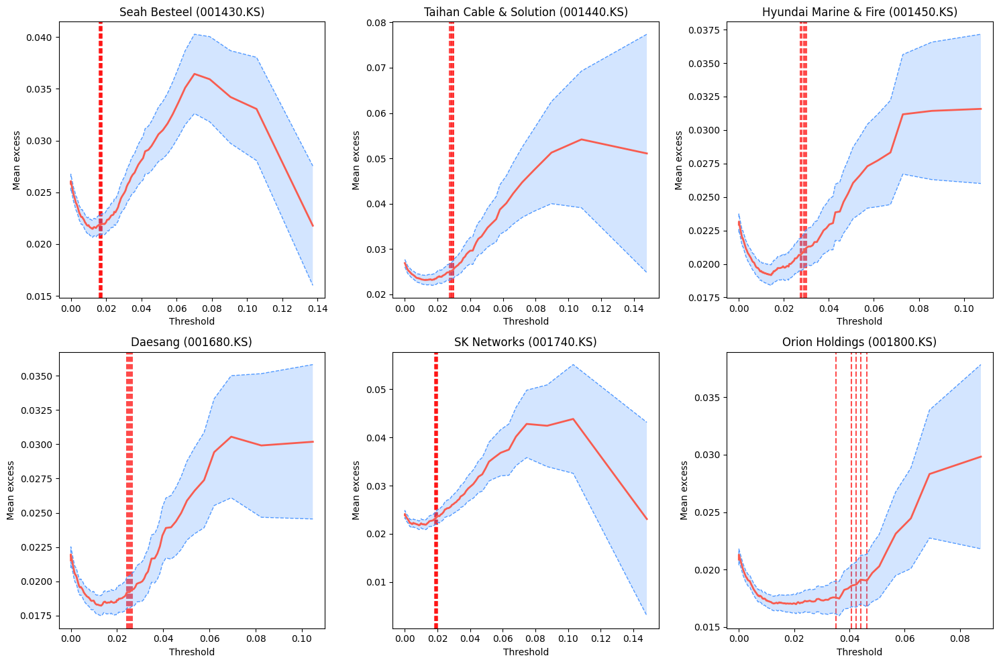

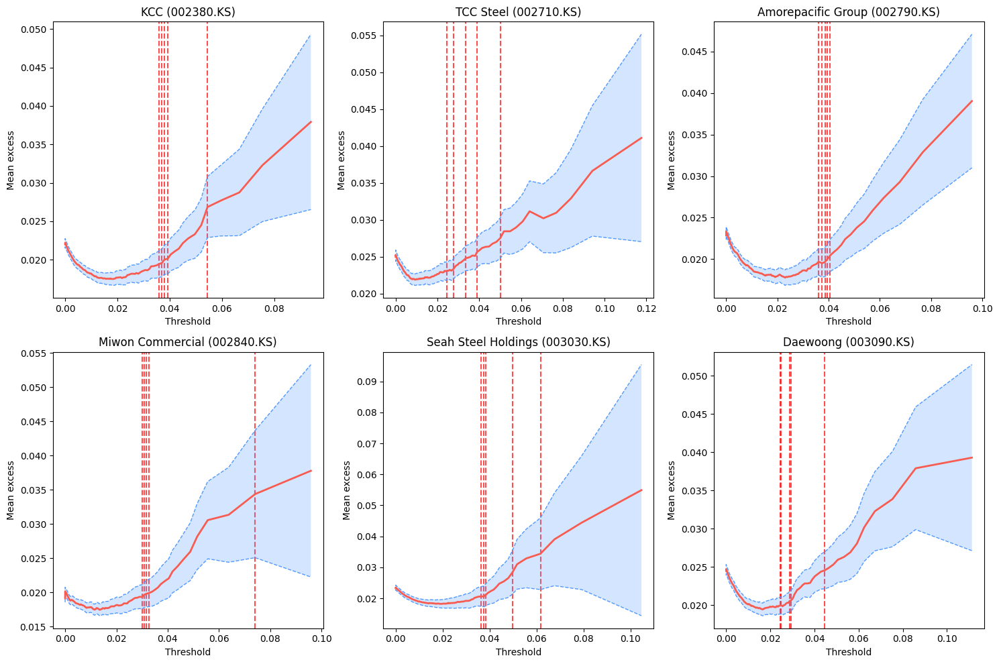

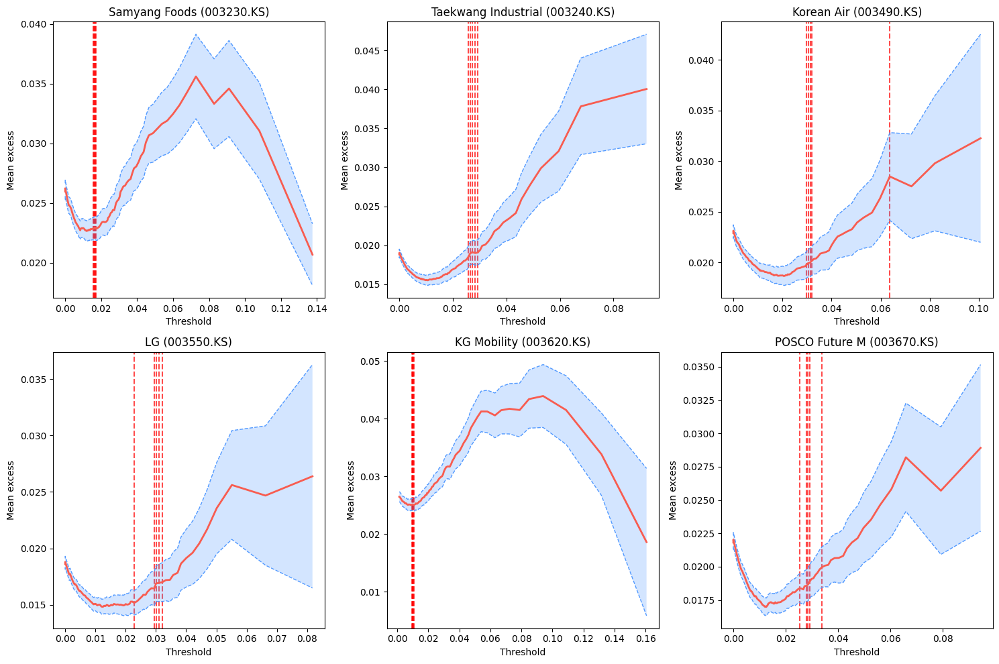

...

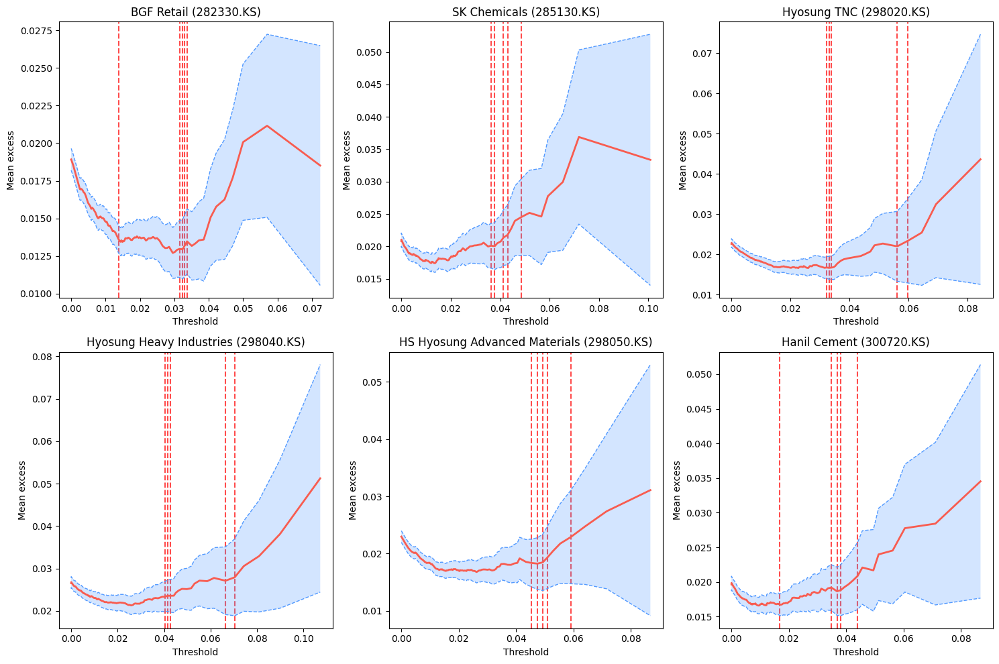

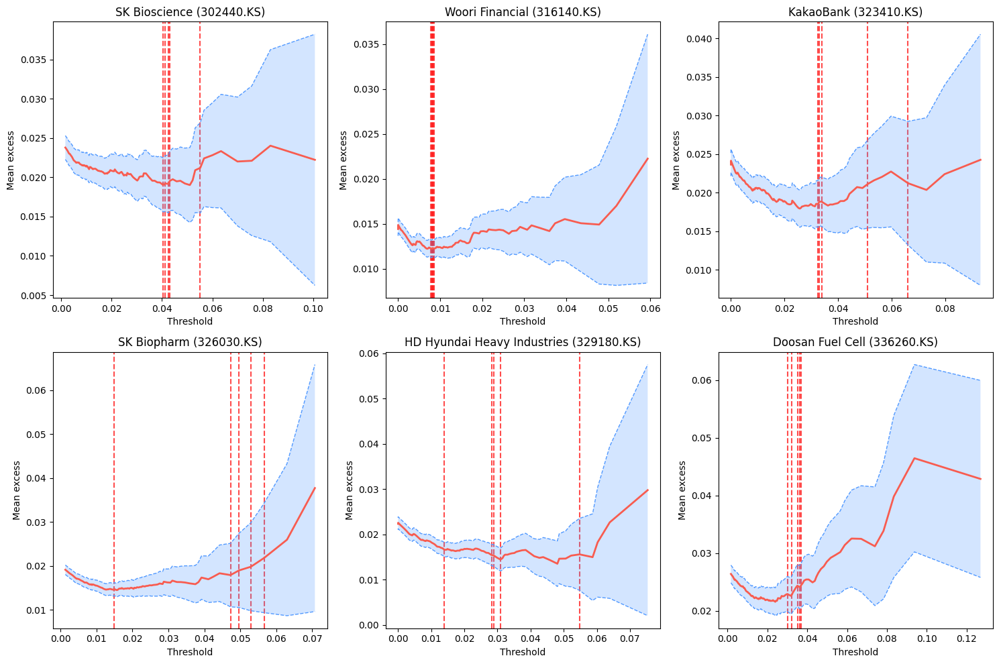

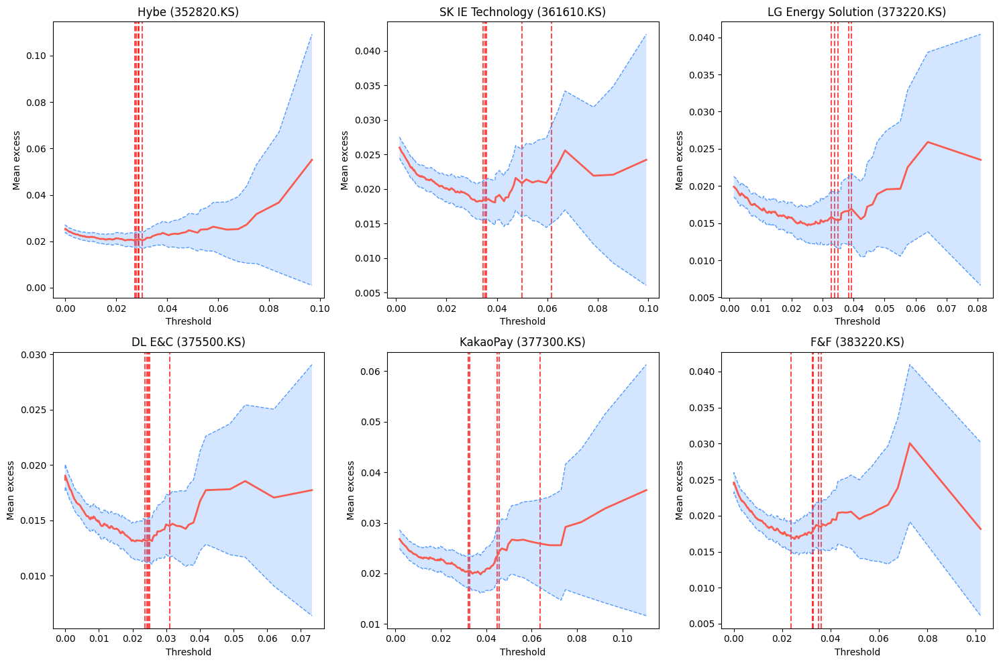

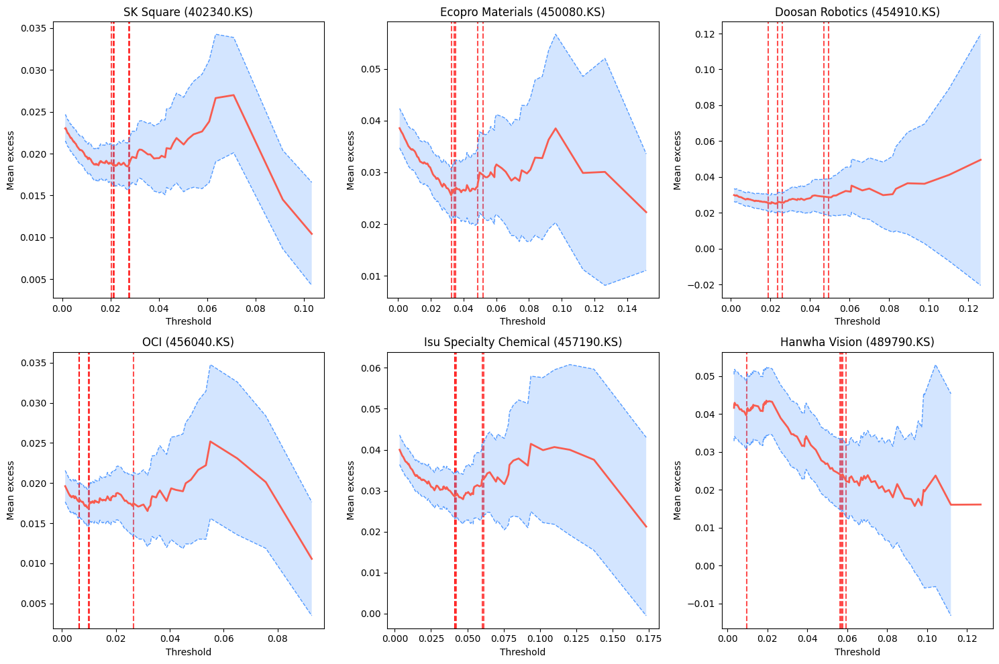

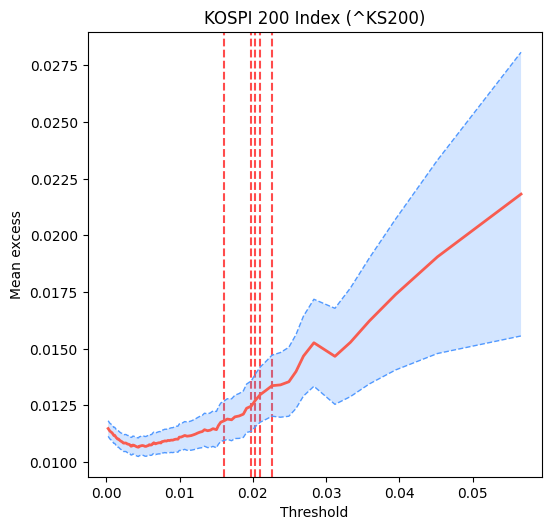

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from pyextremes import plot_mean_residual_life

# PDF 저장 객체 생성
with PdfPages("mrl_plots_all.pdf") as pdf:
    tickers = df_all["Ticker"].unique()

    # 6개씩 페이지 분할
    for i in range(0, len(tickers), 6):
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2행 3열
        axes = axes.flatten()

        for j, ticker in enumerate(tickers[i:i+6]):
            ax = axes[j]
            series = logDD[ticker].dropna().sort_index()
            q = np.linspace(0.01, 0.99, 99)
            us = series.quantile(q)
            thresholds = df_all[df_all["Ticker"] == ticker]["threshold"].values

            # MRL plot 그리기
            plot_mean_residual_life(
                series,
                thresholds=us,
                alpha=0.95,
                extremes_type="high",
                ax=ax
            )
            for u in thresholds:
                ax.axvline(u, color="red", linestyle="--", alpha=0.7)

            ax.set_title(f"{ticker_to_name[ticker]} ({ticker})")

        # 남은 subplot 비우기
        for k in range(j + 1, 6):
            fig.delaxes(axes[k])

        plt.tight_layout()
        plt.show()
        pdf.savefig(fig)
        plt.close(fig)